In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import seaborn as sns
from datetime import datetime
# to create train and test partitions
from sklearn.model_selection import train_test_split
# for computing the cross validation performance measures
from sklearn.model_selection import cross_val_score
# to implement k-fold cross validation
from sklearn.model_selection import RepeatedKFold
# to perform model hyperparameter optimisation
from sklearn.model_selection import GridSearchCV
# to calculate the mean absolute error
from sklearn.metrics import mean_absolute_error
# to create Ridge and LASSO models
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
# to scale the data for LASSO
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
#For the dashboard
import altair as alt
import panel as pn
from sklearn import datasets, linear_model
from sklearn.metrics import r2_score, mean_absolute_error
import plotly.express as px
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
# Read the dataset into a dataframe
df=pd.read_csv("https://raw.githubusercontent.com/Cathal-OD/CCT_Datasets/SA_Dataset/COVID-19_HPSC_County_Statistics_Historic_Data.csv")
df

,OBJECTID,ORIGID,CountyName,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,ConfirmedCovidCases,PopulationProportionCovidCases,ConfirmedCovidDeaths,ConfirmedCovidRecovered,SHAPE_Length,SHAPE_Area
0,1,1,Carlow,56932,2020/02/27 00:00:00+00,278661,163444,52.7168,-6.8367,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,3.193486e+05,-2.432352e+09
1,2,2,Cavan,76176,2020/02/27 00:00:00+00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,5.159545e+05,-5.575010e+09
2,3,3,Clare,118817,2020/02/27 00:00:00+00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.013949e+06,-8.722542e+09
3,4,4,Cork,542868,2020/02/27 00:00:00+00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,2.129949e+06,-1.952949e+10
4,5,5,Donegal,159192,2020/02/27 00:00:00+00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,2.145086e+06,1.462404e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28829,281516,22,Tipperary,159553,2023/03/13 00:00:00+00,205427,154345,52.6407,-7.9206,http://data.geohive.ie/resource/county/2ae1962...,54544,34185.505757,NaN,NaN,7.812766e+05,-1.155120e+10
28830,281517,23,Waterford,116176,2023/03/13 00:00:00+00,234676,105809,52.2035,-7.4935,http://data.geohive.ie/resource/county/2ae1962...,42592,36661.616857,NaN,NaN,6.431849e+05,-4.848380e+09
28831,281518,24,Westmeath,88770,2023/03/13 00:00:00+00,238362,255966,53.5524,-7.4219,http://data.geohive.ie/resource/county/2ae1962...,34749,39144.981413,NaN,NaN,4.226693e+05,-5.208706e+09
28832,281519,25,Wexford,149722,2023/03/13 00:00:00+00,301627,141559,52.5164,-6.5037,http://data.geohive.ie/resource/county/2ae1962...,46624,31140.380171,NaN,NaN,5.893245e+05,-6.332221e+09


In [2]:
covid19_df=df # read the dataframe into a new dataframe for further analysis

### Level of Measurement

In [3]:
level_of_measurement = dict(zip(covid19_df.columns, covid19_df.dtypes))

In [4]:
# Print the level of measurement for each column
for column, data_type in level_of_measurement.items():
    print(f"{column}: {data_type}")

OBJECTID: int64
ORIGID: int64
CountyName: object
PopulationCensus16: int64
TimeStamp: object
IGEasting: int64
IGNorthing: int64
Lat: float64
Long: float64
UGI: object
ConfirmedCovidCases: int64
PopulationProportionCovidCases: float64
ConfirmedCovidDeaths: float64
ConfirmedCovidRecovered: float64
SHAPE_Length: float64
SHAPE_Area: float64


### Continuous Variables

In [5]:
continuous_cols = ['PopulationCensus16', 'ConfirmedCovidCases', 'PopulationProportionCovidCases', 'ConfirmedCovidDeaths', 'ConfirmedCovidRecovered']

# Calculate the statistics for each column
for col in continuous_cols:
    print(col)
    print("Minimum:", df[col].min())
    print("Maximum:", df[col].max())
    print("Range:", df[col].max() - df[col].min())
    print("Mean:", df[col].mean())
    print("Median:", df[col].median())
    print("Standard deviation:", df[col].std())
    print()

PopulationCensus16
Minimum: 32044
Maximum: 1347359
Range: 1315315
Mean: 183148.65384615384
Median: 123850.5
Standard deviation: 252804.6436567924

ConfirmedCovidCases
Minimum: 0
Maximum: 507661
Range: 507661
Mean: 27986.960532704445
Median: 9869.5
Standard deviation: 62098.48093529801

PopulationProportionCovidCases
Minimum: 0.0
Maximum: 42508.6067589405
Range: 42508.6067589405
Mean: 15073.14607678285
Median: 7114.02365734095
Standard deviation: 14647.854882131911

ConfirmedCovidDeaths
Minimum: nan
Maximum: nan
Range: nan
Mean: nan
Median: nan
Standard deviation: nan

ConfirmedCovidRecovered
Minimum: nan
Maximum: nan
Range: nan
Mean: nan
Median: nan
Standard deviation: nan



### Categorical Variables

In [6]:
categorical_cols = ['OBJECTID', 'ORIGID', 'CountyName', 'TimeStamp']

# Calculate the mode and cardinality for each column
for col in categorical_cols:
    print(col)
    print("Mode:", df[col].mode().values[0])
    print("Cardinality:", df[col].nunique())
    print()

OBJECTID
Mode: 1
Cardinality: 28834

ORIGID
Mode: 1
Cardinality: 26

CountyName
Mode: Carlow
Cardinality: 26

TimeStamp
Mode: 2020/02/27 00:00:00+00
Cardinality: 1109



### Missing Values per Variable

In [7]:
missing_values = df.isnull().sum()

# Print the number of missing values for each variable
print("Missing values for each variable:")
print(missing_values)

Missing values for each variable:
OBJECTID                              0
ORIGID                                0
CountyName                            0
PopulationCensus16                    0
TimeStamp                             0
IGEasting                             0
IGNorthing                            0
Lat                                   0
Long                                  0
UGI                                   0
ConfirmedCovidCases                   0
PopulationProportionCovidCases       78
ConfirmedCovidDeaths              28834
ConfirmedCovidRecovered           28834
SHAPE_Length                          0
SHAPE_Area                            0
dtype: int64


### Histograms per Categorical Variable

In [8]:
cat_cols = ['OBJECTID', 'ORIGID', 'CountyName', 'TimeStamp']

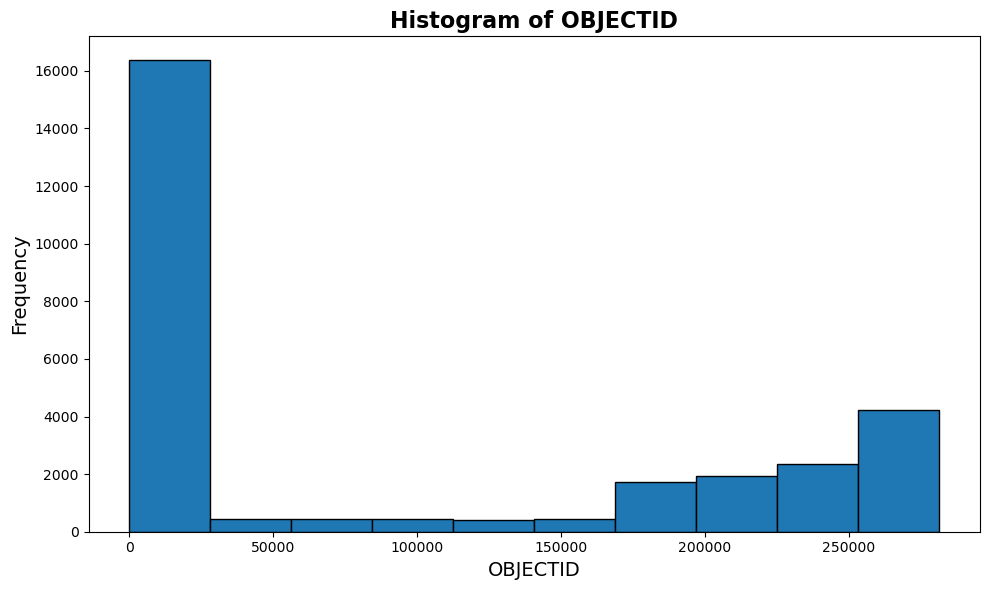

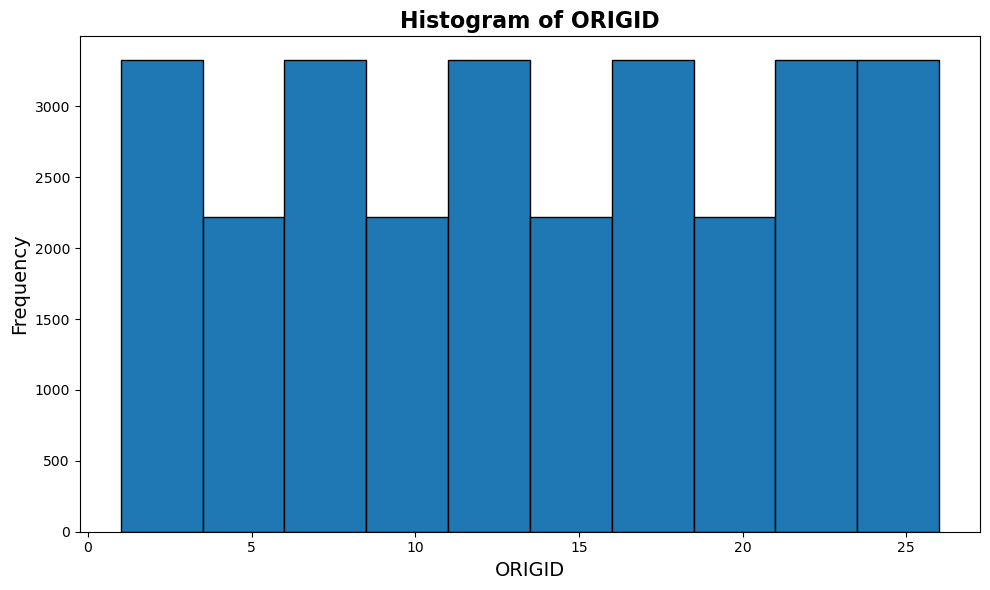

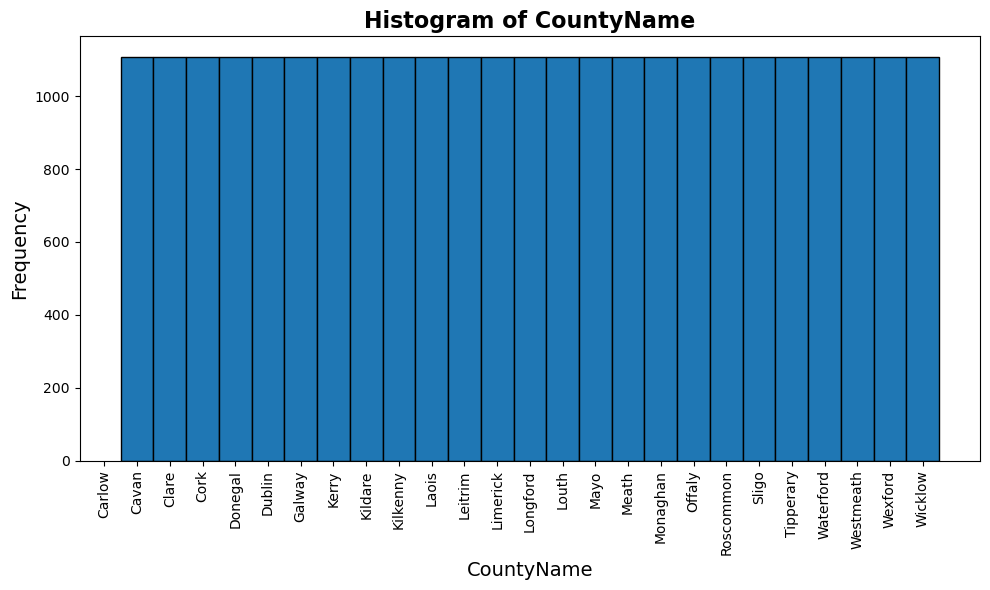

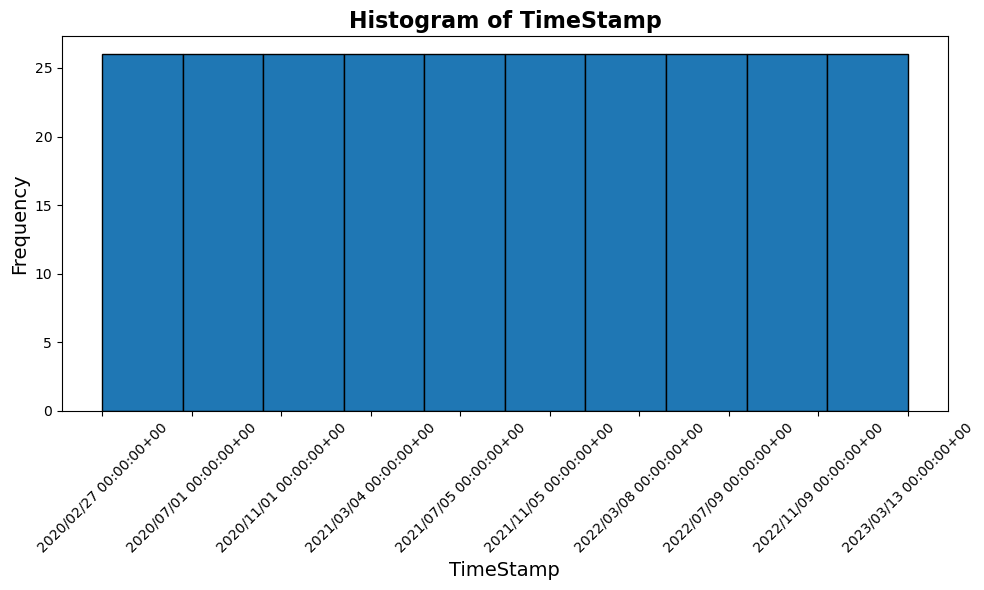

In [9]:
# Create a histogram for each categorical variable
for col in cat_cols:
    plt.figure(figsize=(10, 6))
    if col == 'CountyName':
        # Adjust bin edges to align with unique county names
        bins = np.arange(len(df[col].unique())) + 0.5
        plt.hist(df[col], bins=bins, edgecolor='black')
        plt.xticks(rotation=90)
    elif col == 'TimeStamp':
        # Select 10 evenly spaced timestamps from the dataset
        timestamps = np.linspace(0, len(df[col].unique()) - 1, 10, dtype=int)
        xticks = df[col].unique()[timestamps]
        # Filter the data to include only the selected timestamps
        filtered_df = df[df[col].isin(xticks)]
        plt.hist(filtered_df[col], edgecolor='black')
        plt.xticks(rotation=45)
    else:
        plt.hist(df[col], edgecolor='black')
    plt.title(f'Histogram of {col}', weight='bold',fontsize=16)
    plt.xlabel(col, fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.tight_layout()
    plt.show()

### Scatter Plot of Continuous Variables

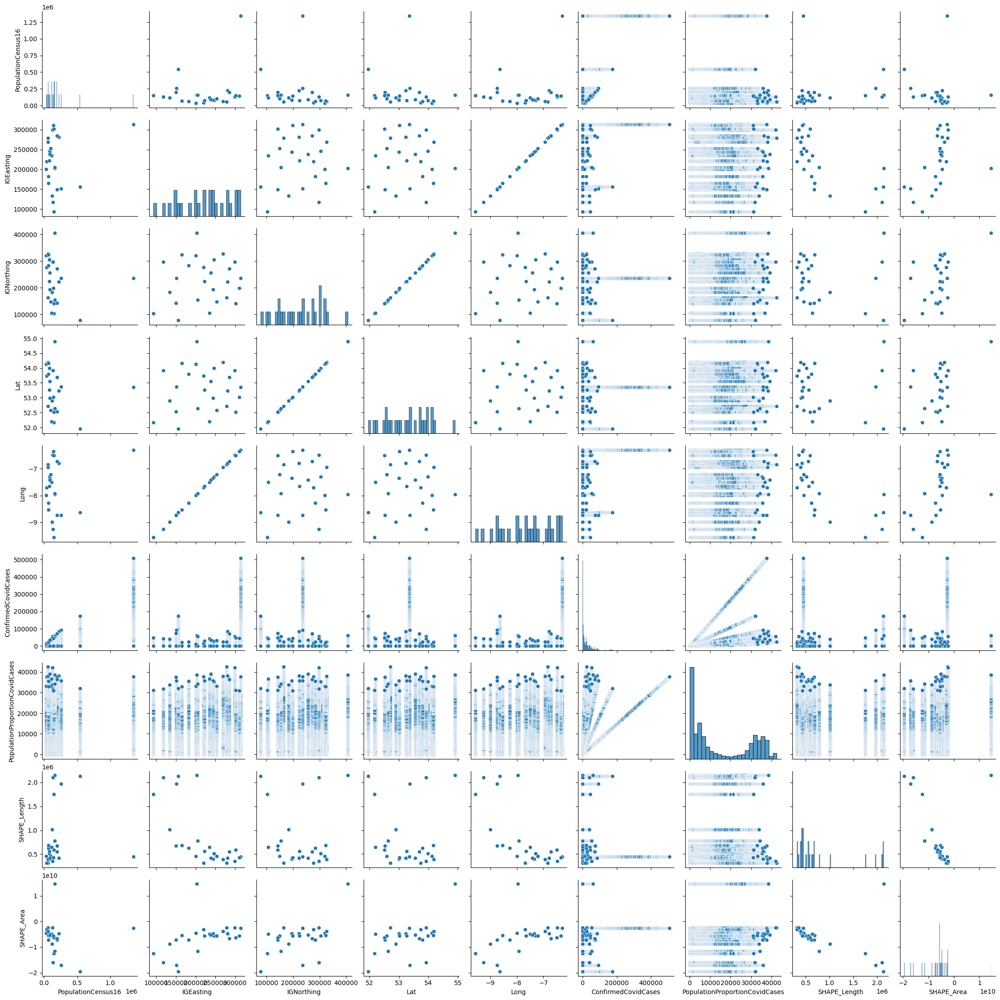

In [12]:
continuous_cols = ['PopulationCensus16', 'IGEasting', 'IGNorthing', 'Lat', 'Long',
                    'ConfirmedCovidCases', 'PopulationProportionCovidCases',
                   'SHAPE_Length', 'SHAPE_Area']

# Create a pairplot of all pairs of continuous variables
sns.pairplot(data=df[continuous_cols])

### Correlation

In [13]:
# Calculate the correlation coefficients for all pairs of continuous variables
corr = df[continuous_cols].corr(method='spearman')

# Print the correlation coefficients
print("Correlation coefficients:")
print(corr)

Correlation coefficients:
                                PopulationCensus16  IGEasting  IGNorthing  \
PopulationCensus16                        1.000000   0.029060   -0.392821   
IGEasting                                 0.029060   1.000000    0.042735   
IGNorthing                               -0.392821   0.042735    1.000000   
Lat                                      -0.392821   0.042735    1.000000   
Long                                      0.026325   0.999316    0.053675   
ConfirmedCovidCases                       0.363737   0.080513   -0.103722   
PopulationProportionCovidCases           -0.009783   0.070792    0.072385   
SHAPE_Length                              0.464606  -0.702550   -0.170595   
SHAPE_Area                               -0.384607   0.556228    0.431102   

                                     Lat      Long  ConfirmedCovidCases  \
PopulationCensus16             -0.392821  0.026325             0.363737   
IGEasting                       0.042735  0.999316   

In [14]:
corr = df[continuous_cols].corr(method='spearman')

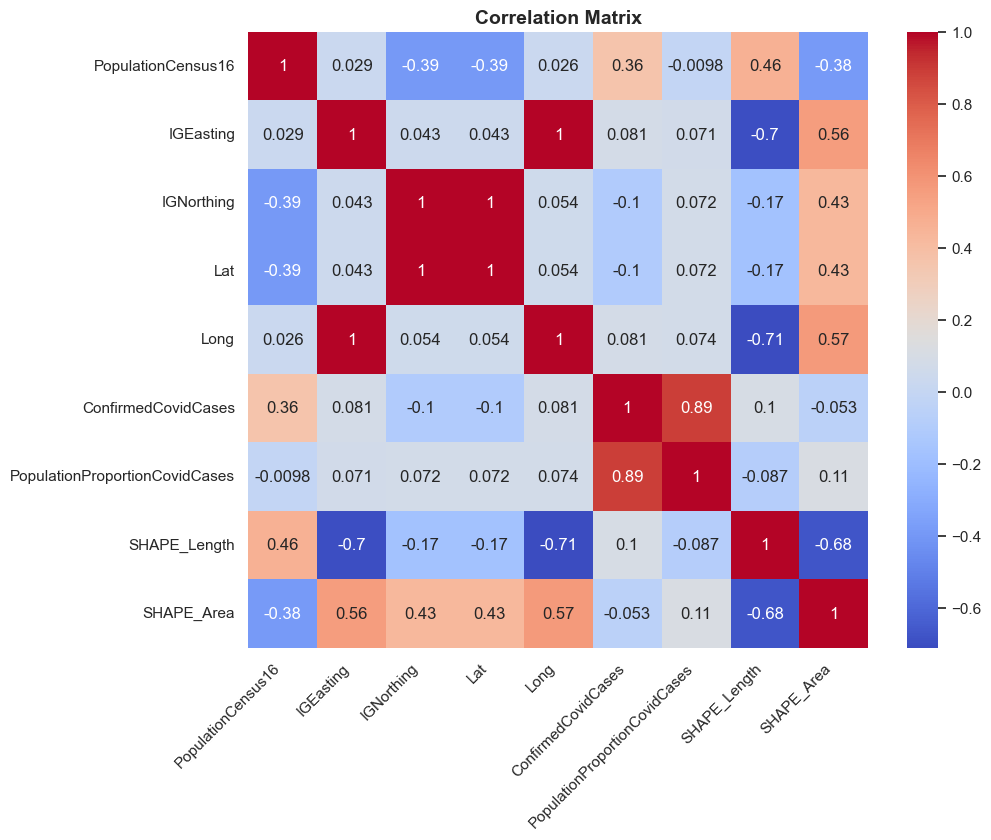

In [15]:
# Create a heatmap of the correlation matrix
sns.set(style='white')
plt.figure(figsize=(10, 8))
ax = sns.heatmap(corr, annot=True, cmap='coolwarm')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.title('Correlation Matrix', weight='bold', fontsize=14)
plt.show()

### Handling of Missing Data

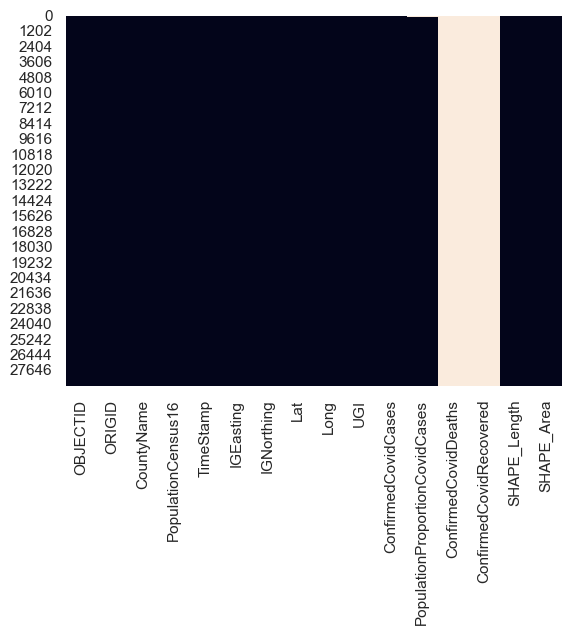

In [16]:
# Heatmap showing missing data

_ = sns.heatmap(covid19_df.isnull(), cbar=False)

In [17]:
# List missing Data

[(col,covid19_df[col].isnull().sum()) for col in covid19_df.columns if covid19_df[col].isnull().any()]

[('PopulationProportionCovidCases', 78),
 ('ConfirmedCovidDeaths', 28834),
 ('ConfirmedCovidRecovered', 28834)]

In [18]:
covid19_df.describe()

,OBJECTID,ORIGID,PopulationCensus16,IGEasting,IGNorthing,Lat,Long,ConfirmedCovidCases,PopulationProportionCovidCases,ConfirmedCovidDeaths,ConfirmedCovidRecovered,SHAPE_Length,SHAPE_Area
count,28834.000000,28834.00000,2.883400e+04,28834.000000,28834.000000,28834.000000,28834.000000,28834.000000,28756.000000,0.0,0.0,2.883400e+04,2.883400e+04
mean,97302.138413,13.50000,1.831487e+05,221392.153846,226489.961538,53.284896,-7.678346,27986.960533,15073.146077,NaN,NaN,8.133962e+05,-6.320569e+09
std,110622.463184,7.50013,2.528046e+05,62007.395824,80996.250483,0.728434,0.926148,62098.480935,14647.854882,NaN,NaN,6.110353e+05,6.114455e+09
min,1.000000,1.00000,3.204400e+04,92975.000000,77860.000000,51.951700,-9.565000,0.000000,0.000000,NaN,NaN,3.152452e+05,-1.952949e+10
25%,7209.250000,7.00000,7.617600e+04,165130.000000,154345.000000,52.640700,-8.534500,1586.000000,1442.948902,NaN,NaN,4.226693e+05,-7.278744e+09
50%,14417.500000,13.50000,1.238505e+05,228683.000000,229746.000000,53.311850,-7.577100,9869.500000,7114.023657,NaN,NaN,5.581426e+05,-5.566918e+09
75%,215913.750000,20.00000,1.595530e+05,278661.000000,297349.000000,53.916100,-6.836700,31760.750000,31466.405626,NaN,NaN,7.812766e+05,-4.618680e+09
max,281520.000000,26.00000,1.347359e+06,313762.000000,405691.000000,54.898900,-6.292000,507661.000000,42508.606759,NaN,NaN,2.145086e+06,1.462404e+10


In [19]:
print(covid19_df['PopulationProportionCovidCases'].median())

7114.02365734095


### Data Preparation

In [20]:
# Fill in missing values


covid19_df['PopulationProportionCovidCases'] = covid19_df['PopulationProportionCovidCases'].fillna(covid19_df['PopulationProportionCovidCases'].median())
covid19_df.isnull().sum()

OBJECTID                              0
ORIGID                                0
CountyName                            0
PopulationCensus16                    0
TimeStamp                             0
IGEasting                             0
IGNorthing                            0
Lat                                   0
Long                                  0
UGI                                   0
ConfirmedCovidCases                   0
PopulationProportionCovidCases        0
ConfirmedCovidDeaths              28834
ConfirmedCovidRecovered           28834
SHAPE_Length                          0
SHAPE_Area                            0
dtype: int64

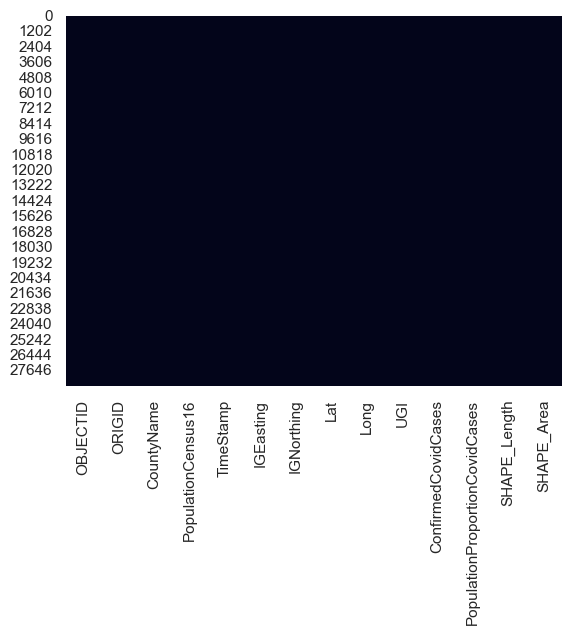

In [21]:
# Remove columns

covid19_df=df.drop(['ConfirmedCovidDeaths', 'ConfirmedCovidRecovered'], axis=1)
_ = sns.heatmap(covid19_df.isnull(), cbar=False) # Confirm no missing data using a heatmap

In [22]:
# dummy-encoding of variables

covid19_data_encoded = pd.get_dummies(data=covid19_df,drop_first=True)
covid19_data_encoded

,OBJECTID,ORIGID,PopulationCensus16,IGEasting,IGNorthing,Lat,Long,ConfirmedCovidCases,PopulationProportionCovidCases,SHAPE_Length,...,UGI_http://data.geohive.ie/resource/county/2ae19629-144d-13a3-e055-000000000001,UGI_http://data.geohive.ie/resource/county/2ae19629-144e-13a3-e055-000000000001,UGI_http://data.geohive.ie/resource/county/2ae19629-144f-13a3-e055-000000000001,UGI_http://data.geohive.ie/resource/county/2ae19629-1450-13a3-e055-000000000001,UGI_http://data.geohive.ie/resource/county/2ae19629-1451-13a3-e055-000000000001,UGI_http://data.geohive.ie/resource/county/2ae19629-1452-13a3-e055-000000000001,UGI_http://data.geohive.ie/resource/county/2ae19629-1453-13a3-e055-000000000001,UGI_http://data.geohive.ie/resource/county/2ae19629-1454-13a3-e055-000000000001,UGI_http://data.geohive.ie/resource/county/2ae19629-1455-13a3-e055-000000000001,UGI_http://data.geohive.ie/resource/county/2ae19629-1456-13a3-e055-000000000001
0,1,1,56932,278661,163444,52.7168,-6.8367,0,7114.023657,3.193486e+05,...,False,False,False,False,False,False,False,False,False,False
1,2,2,76176,246380,304501,53.9878,-7.2937,0,7114.023657,5.159545e+05,...,False,False,False,False,False,False,False,False,False,False
2,3,3,118817,133493,182732,52.8917,-8.9889,0,7114.023657,1.013949e+06,...,False,False,False,True,False,False,False,False,False,False
3,4,4,542868,156242,77860,51.9517,-8.6372,0,7114.023657,2.129949e+06,...,False,False,False,False,True,False,False,False,False,False
4,5,5,159192,202615,405691,54.8989,-7.9600,0,7114.023657,2.145086e+06,...,False,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28829,281516,22,159553,205427,154345,52.6407,-7.9206,54544,34185.505757,7.812766e+05,...,False,False,False,False,False,False,False,False,False,False
28830,281517,23,116176,234676,105809,52.2035,-7.4935,42592,36661.616857,6.431849e+05,...,False,False,False,False,False,False,False,False,False,False
28831,281518,24,88770,238362,255966,53.5524,-7.4219,34749,39144.981413,4.226693e+05,...,False,False,False,False,False,False,False,False,False,False
28832,281519,25,149722,301627,141559,52.5164,-6.5037,46624,31140.380171,5.893245e+05,...,True,False,False,False,False,False,False,False,False,False


In [23]:
# Split data into train and test partitions

train, test = train_test_split(covid19_data_encoded,test_size = 0.2,random_state=12345)
X_train = train.drop(['ConfirmedCovidCases'],axis=1)
y_train = train.filter(['ConfirmedCovidCases'])
X_test = test.drop(['ConfirmedCovidCases'],axis=1)
y_test = test.filter(['ConfirmedCovidCases'])
y_range = y_test.max() - y_test.min()
y_range

ConfirmedCovidCases    507585
dtype: int64

### Regression Analysis

In [24]:
# Ridge Regression Analysis

ridge_model = Ridge(alpha=1.0)
cv = RepeatedKFold(n_splits=10,n_repeats=3,random_state=40)
MAE = cross_val_score(ridge_model,X_train,y_train,scoring="neg_mean_absolute_error",cv=cv,n_jobs=-1)
MAE = np.absolute(MAE)
print("Average MAE: {:.3f} ({:.3f})".format(np.mean(MAE), np.std(MAE)))

Average MAE: 18597.860 (652.285)


In [25]:
# Test values of Alpha

tune_grid = dict()
tune_grid['alpha'] = [(x/(10**13)) for x in list(range(1,5,1))]
tune_grid

{'alpha': [1e-13, 2e-13, 3e-13, 4e-13]}

In [26]:
tune = GridSearchCV(ridge_model,tune_grid,scoring='neg_mean_absolute_error',cv=cv)
tune_results = tune.fit(X_train,y_train)
print('MAE: {:.3f}'.format(-tune_results.best_score_))
print('Parameters: {}'.format(tune_results.best_params_))

MAE: 85975.957
Parameters: {'alpha': 4e-13}


In [27]:
# Build Ridge Model

ridge = Ridge(alpha=(4e-13)) # use alpha value from tune results
ridge.fit(X_train, y_train)
ridge_y_predicted = ridge.predict(X_test)
print('Test MAE: {:3f}'.format(mean_absolute_error(y_test,ridge_y_predicted)))

Test MAE: 18939.361742


In [28]:
# Evaluate the results

ridge_coef = ridge.coef_
ridge_coefficients = {X_train.columns[i]: ridge_coef[0][i] for i in range(len(X_train.columns))}
ridge_coefficients

{'OBJECTID': -64.9051817850795,
 'ORIGID': -7299355.919189075,
 'PopulationCensus16': -25.9793117808456,
 'IGEasting': 1854.773195864203,
 'IGNorthing': 409.4569797856339,
 'Lat': -18683068.440939385,
 'Long': -59734241.442444675,
 'PopulationProportionCovidCases': 1.5486812987481102,
 'SHAPE_Length': -19.852026771601267,
 'SHAPE_Area': -0.006576097716995192,
 'CountyName_Cavan': 64392496.21212435,
 'CountyName_Clare': 180885270.7898227,
 'CountyName_Cork': -19792312.04610392,
 'CountyName_Donegal': 305132361.8021889,
 'CountyName_Dublin': -81048947.92141452,
 'CountyName_Galway': 169774064.9359391,
 'CountyName_Kerry': 43407277.40425116,
 'CountyName_Kildare': -32064344.382524587,
 'CountyName_Kilkenny': 122365866.58006817,
 'CountyName_Laois': 1687348.8108389273,
 'CountyName_Leitrim': 93348100.71858332,
 'CountyName_Limerick': 171744612.07760498,
 'CountyName_Longford': 114014073.70268759,
 'CountyName_Louth': 199861059.82519576,
 'CountyName_Mayo': 299579740.3674115,
 'CountyName_M

In [29]:
# Lasso regression Analysis

lasso_model = Lasso(tol=2e-1,max_iter=2000)
cv = RepeatedKFold(n_splits=10,n_repeats=3,random_state=42)

In [30]:
# Test values of Alpha

tune_grid = dict()
tune_grid['alpha'] = [(x/(10**5)) for x in list(range(1,5,1))]
tune_grid

{'alpha': [1e-05, 2e-05, 3e-05, 4e-05]}

In [31]:
tune = GridSearchCV(lasso_model,tune_grid,scoring='neg_mean_absolute_error',cv=cv)
tune_results = tune.fit(StandardScaler().fit_transform(X_train),y_train)

print('MAE: {:.3f}'.format(-tune_results.best_score_))
print('Parameters: {}'.format(tune_results.best_params_))

MAE: 18961.344
Parameters: {'alpha': 4e-05}


In [32]:
# Build Lasso regression model

lasso = Lasso(alpha=4e-05,max_iter=5000) # use alpha value from tune results
lasso.fit(X_train, y_train)
lasso_y_predicted = lasso.predict(X_test)
print('Test MAE: {:3f}'.format(mean_absolute_error(y_test,lasso_y_predicted)))

Test MAE: 18790.936413


In [33]:
# Evaluate the Results

lasso_coef = lasso.coef_
lasso_coefficients = {X_train.columns[i]: lasso_coef[i] for i in range(len(X_train.columns))}
lasso_coefficients

{'OBJECTID': 0.18285209054309157,
 'ORIGID': -848.6197067967045,
 'PopulationCensus16': 0.16000886941477763,
 'IGEasting': 0.004847098629552741,
 'IGNorthing': 0.057081804663452855,
 'Lat': 2.3333603569279675,
 'Long': -500.4171062026399,
 'PopulationProportionCovidCases': 1.5431410181598926,
 'SHAPE_Length': -0.0020305343643480765,
 'SHAPE_Area': -6.0875229161166e-07,
 'CountyName_Cavan': -11743.997323537094,
 'CountyName_Clare': -5852.890492227048,
 'CountyName_Cork': -13974.0529674444,
 'CountyName_Donegal': -2101.783908393425,
 'CountyName_Dublin': 1655.8149016343075,
 'CountyName_Galway': -12592.918916144034,
 'CountyName_Kerry': -1022.3695882923333,
 'CountyName_Kildare': -4740.939556163322,
 'CountyName_Kilkenny': 294.28488297151375,
 'CountyName_Laois': 4092.9736397203924,
 'CountyName_Leitrim': 79.40469981187219,
 'CountyName_Limerick': 6417.661909135294,
 'CountyName_Longford': 1818.643440458017,
 'CountyName_Louth': 1910.767760391338,
 'CountyName_Mayo': -1944.7213807201294,

### Principal Components Analysis

In [34]:
# Drop Object variables

covid19_pca=covid19_df.drop(['TimeStamp', 'UGI','CountyName'], axis=1)

In [35]:
# Dimensionality Reduction

covid19_pca=preprocessing.StandardScaler().fit_transform(covid19_pca)
covid19_standardised = preprocessing.scale(covid19_pca,with_std = True, with_mean=True, axis=0)

In [36]:
# Build Principal Components Analysis 

pca = PCA()
fit = pca.fit_transform(covid19_standardised)

In [37]:
# Show results

pca.explained_variance_

array([3.16879868e+00, 2.42077505e+00, 2.11486009e+00, 1.55956541e+00,
       7.75137858e-01, 4.05043576e-01, 3.33318941e-01, 1.99155545e-01,
       2.36183666e-02, 9.97323471e-05, 8.26093122e-06])

In [38]:
pca.explained_variance_ratio_

array([2.88062617e-01, 2.20062826e-01, 1.92253340e-01, 1.41773757e-01,
       7.04646341e-02, 3.68208663e-02, 3.03006710e-02, 1.81044217e-02,
       2.14704977e-03, 9.06626257e-06, 7.50967702e-07])

In [39]:
pca.components_[0,]

array([-0.04855202, -0.15001037, -0.01229034, -0.48997975, -0.28164276,
       -0.28089072, -0.4899468 , -0.05898661, -0.08271323,  0.40325539,
       -0.40460161])

Text(0, 0.5, 'Eigenvalue')

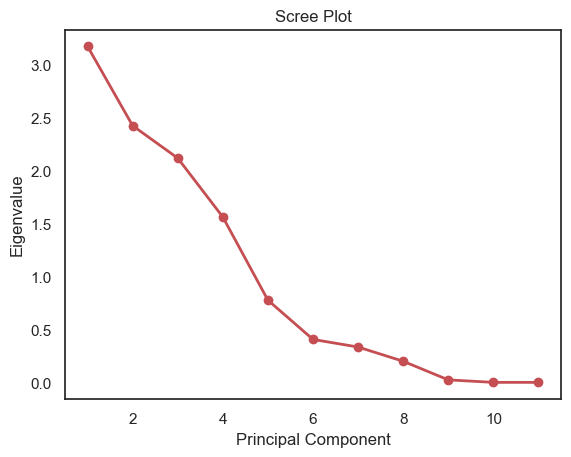

In [40]:
# Visualise Results.

principal_component_number = np.arange(11) + 1
plt.plot(
    principal_component_number, 
    pca.explained_variance_, 
    'ro-', 
    linewidth=2
)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Eigenvalue')

In [41]:
pn.extension('plotly')

# Dashboard

## Interactive Dashboard - Scatter Plot


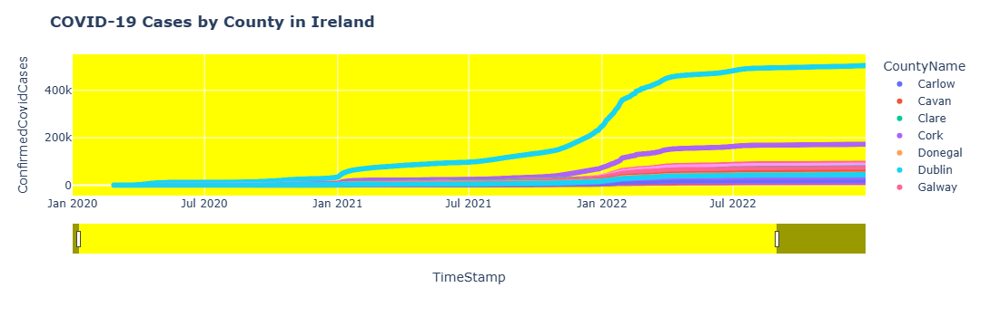

In [42]:
df['TimeStamp'] = pd.to_datetime(df['TimeStamp']).dt.date

# Create a scatter plot of the continuous variables, with color based on CountyName
fig = px.scatter(df, x='TimeStamp', y='ConfirmedCovidCases', color='CountyName', range_x=['2020-01-01', '2022-12-31'])

# Add a slider for the year
fig.update_layout(title="<b>COVID-19 Cases by County in Ireland</b>",
    xaxis=dict(
        rangeslider=dict(
            visible=True
        ),
        type='date',
        )
                 )
fig.update_layout({
'plot_bgcolor': 'rgba(255, 255, 0, 1)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})

fig.show()

## Interactive Dashboard - Heatmap

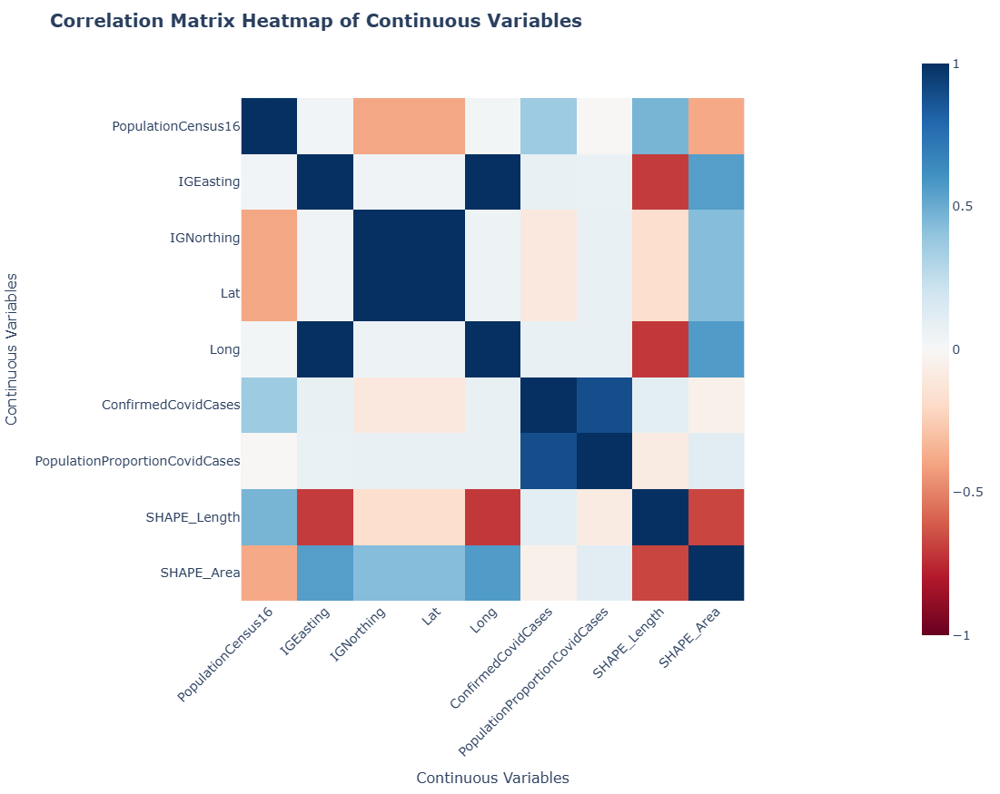

In [43]:
corr = df[continuous_cols].corr(method='spearman')

fig = px.imshow(corr.values,
                x=list(corr.columns),
                y=list(corr.columns),
                color_continuous_scale='RdBu',
                zmin=-1,
                zmax=1)

fig.update_traces(hovertemplate='Correlation: %{z:.2f}<extra></extra>')
fig.update_layout(
    xaxis=dict(title=dict(text='Continuous Variables', font=dict(size=16)), tickangle=-45),
    yaxis=dict(title=dict(text='Continuous Variables', font=dict(size=16))),
    font=dict(size=14),
    width=925,
    height=875,
    title=dict(text='<b>Correlation Matrix Heatmap of Continuous Variables</b>', font=dict(size=20)),
    coloraxis=dict(colorscale='RdBu')
)

fig.show()


## Interactive Dashboard - Box Plot

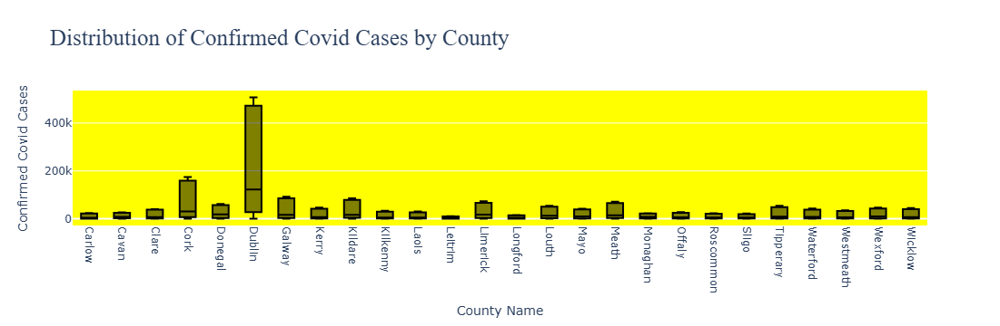

In [44]:
fig = px.box(df, x= "CountyName", y="ConfirmedCovidCases", color_discrete_sequence=['black'], title= "Distribution of Confirmed Covid Cases by County")
fig.update_xaxes(title= "County Name", tickangle=90)
fig.update_yaxes(title= "Confirmed Covid Cases")
fig.update_layout(title_font_family="Balto", title_font_size=25, plot_bgcolor="yellow", hoverlabel=dict(bgcolor="lightyellow",font_size=16,font_family="Gravitas One"))
fig.show()

## Interactive Dashboard - Histogram

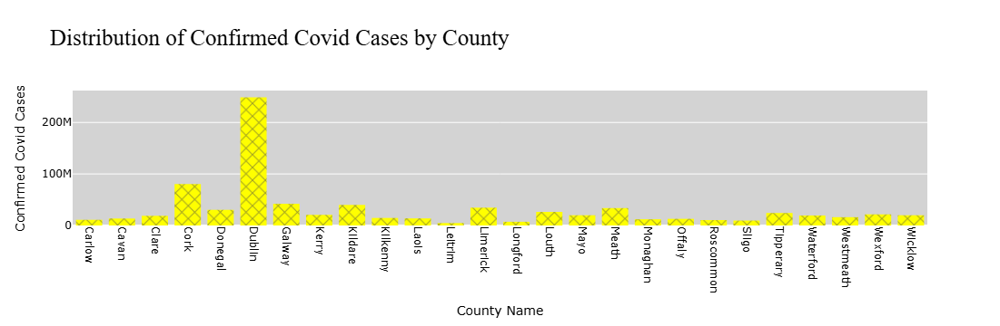

In [45]:
fig = px.histogram(df, x= "CountyName", y="ConfirmedCovidCases", color_discrete_sequence=['yellow'],pattern_shape_sequence=[ "x"], title= "Distribution of Confirmed Covid Cases by County")
fig.update_xaxes(title= "County Name", tickangle=90)
fig.update_yaxes(title= "Confirmed Covid Cases")
fig.update_layout(title_font_family="Droid Sans", title_font_size=25, plot_bgcolor="lightgrey", font_color="black", hoverlabel=dict(bgcolor="black",font_size=16,font_color="yellow",font_family="Balto"))
fig.show()

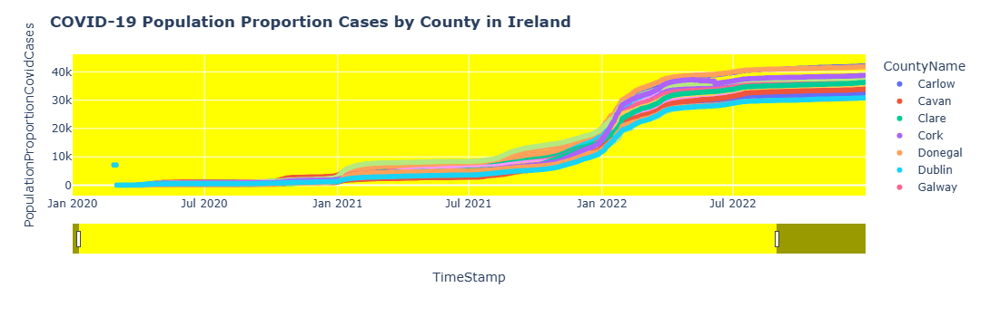

In [46]:
# Create a scatter plot of the continuous variables, with color based on CountyName
fig = px.scatter(df, x='TimeStamp', y='PopulationProportionCovidCases', color='CountyName', range_x=['2020-01-01', '2022-12-31'])

# Add a slider for the year
fig.update_layout(title="<b>COVID-19 Population Proportion Cases by County in Ireland</b>",
    xaxis=dict(
        rangeslider=dict(
            visible=True
        ),
        type='date',
        )
                 )
fig.update_layout({
'plot_bgcolor': 'rgba(255, 255, 0, 1)',
'paper_bgcolor': 'rgba(0, 0, 0, 0)',
})

fig.show()